In [1]:
%load_ext autoreload
%autoreload 2

In [72]:
import pandas as pd

for i in range(1,113):
    # print(i)
    df = pd.read_csv("/SSD/scratch/optic_disc/OD_batch"+str(i)+".csv", index_col=0)

    df["width"] = df["width"] * 6
    df['height'] = df['height'] * 6

    df['area'] = df['area'] * 6*6
    df['center_x_y'] = [str_to_tuple(i) for i in df['center_x_y']]
    # print(df.shape)
    
    if i==1:
        df_out = df
    else:
        df_out = pd.concat([df_out,df])
        print(df_out.shape)

(3104, 4)
(4656, 4)
(6208, 4)
(7760, 4)
(9312, 4)
(10864, 4)
(12416, 4)
(13968, 4)
(15520, 4)
(17072, 4)
(18624, 4)
(20176, 4)
(21728, 4)
(23280, 4)
(24832, 4)
(26384, 4)
(27936, 4)
(29488, 4)
(31040, 4)
(32592, 4)
(34144, 4)
(35696, 4)
(37248, 4)
(38800, 4)
(40352, 4)
(41904, 4)
(43456, 4)
(45008, 4)
(46560, 4)
(48112, 4)
(49664, 4)
(51216, 4)
(52768, 4)
(54320, 4)
(55872, 4)
(57424, 4)
(58976, 4)
(60528, 4)
(62080, 4)
(63632, 4)
(65184, 4)
(66736, 4)
(68288, 4)
(69840, 4)
(71392, 4)
(72944, 4)
(74496, 4)
(76048, 4)
(77600, 4)
(79152, 4)
(80704, 4)
(82256, 4)
(83808, 4)
(85360, 4)
(86912, 4)
(88464, 4)
(90016, 4)
(91568, 4)
(93120, 4)
(94672, 4)
(96224, 4)
(97776, 4)
(99328, 4)
(100880, 4)
(102432, 4)
(103984, 4)
(105536, 4)
(107088, 4)
(108640, 4)
(110192, 4)
(111744, 4)
(113296, 4)
(114848, 4)
(116400, 4)
(117952, 4)
(119504, 4)
(121056, 4)
(122608, 4)
(124160, 4)
(125712, 4)
(127264, 4)
(128816, 4)
(130368, 4)
(131920, 4)
(133472, 4)
(135024, 4)
(136576, 4)
(138128, 4)
(139680, 4)


In [77]:
df_out.to_pickle("/SSD/scratch/optic_disc/OD_original_shape.pkl")

In [3]:
import pandas as pd
tmpdf = pd.read_pickle("/SSD/scratch/optic_disc/OD_original_shape.pkl")

In [ ]:
for i in tmpdf['center_x_y']:
    try:
        plt.scatter(i[0],i[1])
    except:
        tmp=1

In [2]:
import numpy as np
def str_to_tuple(my_str):
    
    try:
        my_str = my_str.replace('(','')
        my_str = my_str.replace(')','')
        
        my_tuple = tuple(map(int,map(float, my_str.split(', '))))
        
        return (my_tuple[0]*6+256, my_tuple[1]*6)
    
    # some rows are nan
    except Exception as e:
        # print(e)
        return np.nan

In [25]:
df.index[0]

'1373713_21016_0_0.png'

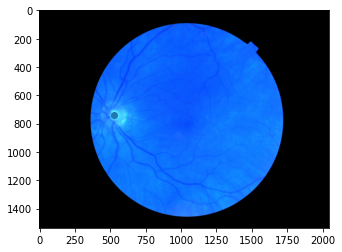

In [6]:
import cv2
from matplotlib import pyplot as plt

i=i+7
img = cv2.imread('/SSD/home/michael/sensitive/ukbb/fundus/raw/CLRIS/' + tmpdf.index[i])
plt.imshow(img)
pos = tmpdf['center_x_y'].iloc[i]
plt.scatter(pos[0],pos[1])

(1536, 2048, 3)

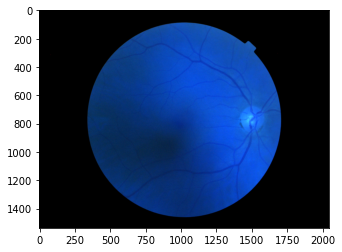

In [7]:
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('/SSD/home/michael/sensitive/ukbb/fundus/raw/CLRIS/1614092_21016_0_0.png')
plt.imshow(img)
img.shape

In [8]:
import os
#import warnings
#warnings.simplefilter('ignore')
from operator import attrgetter
from platform import python_version_tuple

if python_version_tuple()[0] == 3:
    xrange = range

import scipy as sp
import scipy.ndimage
import numpy as np
import pandas as pd
import skimage
import skimage.measure
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import h5py
from tqdm import tqdm_notebook
from IPython.display import display
from extract_data import *

In [4]:
# storing test set

import sys
import glob
import h5py
import cv2

rawdir = "/SSD/home/michael/sensitive/ukbb/fundus/raw/CLRIS/"
nfiles = len(glob.glob(rawdir+'*.png'))
print(f'count of image files nfiles={nfiles}')

count of image files nfiles=173814


In [5]:
# batch prep

n_cpus = int(112)
batch_len = int(np.ceil(nfiles/112))

batches = [(i+1,0+i*batch_len,min((i+1)*batch_len,nfiles-1)) for i in range(0,n_cpus)]

In [6]:
# generate UKBB full dataset


# resize all images and load into a single dataset

import time

def generate_batch(variables):
    
    start = time.time()
    
    batch_no,start,stop = variables
    
    h5file = '/SSD/scratch/optic_disc/resized_256px_batch'+str(batch_no)+'.hdf5'

    IMG_WIDTH = 256
    IMG_HEIGHT = 256

    with h5py.File(h5file,'w') as  h5f:
        
        batch_files = sorted(glob.iglob(rawdir + "*.png"))[start:stop]
        h5f.create_dataset("filenames", data=np.array(batch_files, dtype='S'))
        img_ds = h5f.create_dataset('raw_256px',shape=(stop-start, 256, 256,3), dtype=int)
        for cnt, ifile in enumerate(batch_files) :

            # if cnt % 1000 == 0:
            #     print(cnt)

            img = cv2.imread(ifile, cv2.IMREAD_COLOR)
            img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) # cv2 uses BGR, we would like RGB, I technically used the inverse function, but I believe it ends up the same as BGR and RGB are point symmetrical

            # making square
            im_sq=img[:,256:-256]

            # or use cv2.IMREAD_GRAYSCALE, cv2.IMREAD_UNCHANGED
            img_resize = cv2.resize( im_sq, (IMG_WIDTH, IMG_HEIGHT) )
            img_ds[cnt:cnt+1:,:,:] = img_resize
            
    return (time.time() - start) / 60.0

In [9]:
# ukb generation in parallel

from multiprocessing import Pool

pool = Pool()
times = pool.map(generate_batch, batches)

In [10]:
# generate ground truth hdf

import sys
import glob
import h5py
import cv2

IMG_WIDTH = 256
IMG_HEIGHT = 256

os.chdir("/SSD/home/michael/")
h5file = 'ground_truths.hdf5'

nfiles = len(glob.glob('/SSD/home/michael/brynhild/optic_disc/masks/*.png'))
print(f'count of image files nfiles={nfiles}')

# resize all images and load into a single dataset
with h5py.File(h5file,'w') as  h5f:
    img_ds = h5f.create_dataset('masks',shape=(nfiles, 256, 256,1), dtype=int)
    for cnt, ifile in enumerate(sorted(glob.iglob('/SSD/home/michael/brynhild/optic_disc/masks/*.png'))) :
        print(ifile)
        img = cv2.imread(ifile, cv2.IMREAD_GRAYSCALE)
        
        #binarizing the img
        thresh = 127
        im_bw = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
        
        # making square
        im_bw=im_bw[:,256:-256]
        
        # or use cv2.IMREAD_GRAYSCALE, cv2.IMREAD_UNCHANGED
        img_resize = cv2.resize( im_bw, (IMG_WIDTH, IMG_HEIGHT) )
        img_ds[cnt:cnt+1:,:,:] = np.atleast_3d(img_resize)
        
    img_ds2 = h5f.create_dataset('orig',shape=(nfiles, 256, 256,3), dtype=int)
    for cnt, ifile in enumerate(sorted(glob.iglob('/SSD/home/michael/brynhild/optic_disc/orig/*.png'))) :
        print(ifile)
        img = cv2.imread(ifile, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) # cv2 uses BGR, we would like RGB
        
        # making square
        im_sq=img[:,256:-256]
        
        # or use cv2.IMREAD_GRAYSCALE, cv2.IMREAD_UNCHANGED
        img_resize = cv2.resize( im_sq, (IMG_WIDTH, IMG_HEIGHT) )
        img_ds2[cnt:cnt+1:,:,:] = img_resize

count of image files nfiles=100
/SSD/home/michael/brynhild/optic_disc/masks/1035157_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1068469_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1157696_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1190209_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1201476_21015_0_1.png
/SSD/home/michael/brynhild/optic_disc/masks/1291648_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1303082_21016_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1347637_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1501980_21016_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1621605_21016_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1679900_21015_1_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1745110_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1776645_21015_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/1866964_21016_0_0.png
/SSD/home/michael/brynhild/optic_disc/masks/

In [7]:
import os, h5py
import numpy as np
os.chdir("/SSD/home/michael/")
h5file = 'ground_truths.hdf5'

h5f = h5py.File(h5file)

In [8]:
np.shape(h5f['masks'][0])

(256, 256, 1)

In [13]:
len(h5f['orig']),len(h5f['masks'])

(100, 100)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


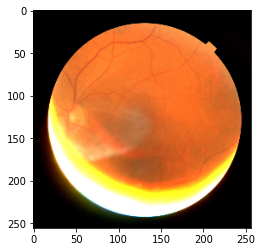

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


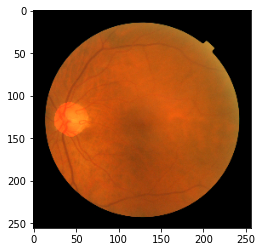

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


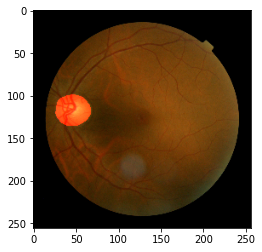

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


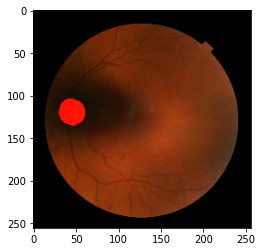

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


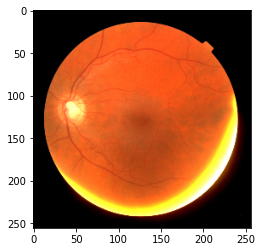

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


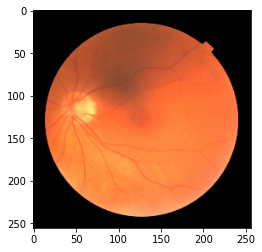

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


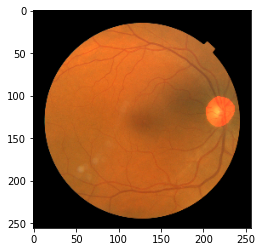

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


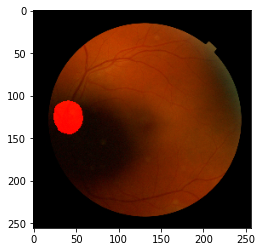

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


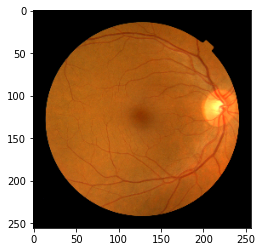

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


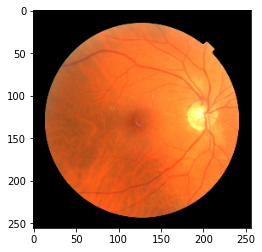

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


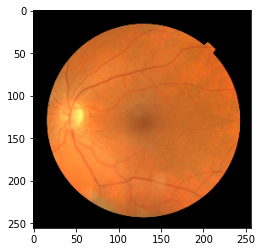

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


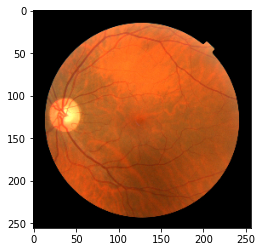

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


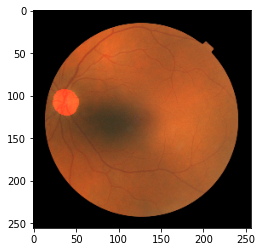

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


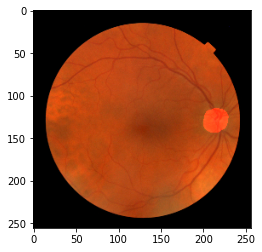

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


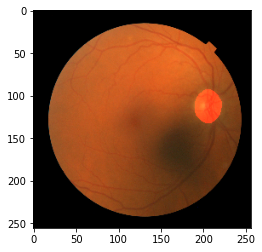

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


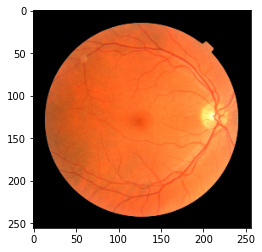

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


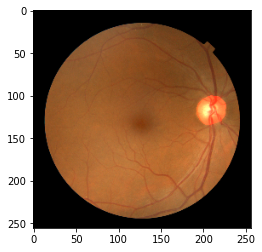

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


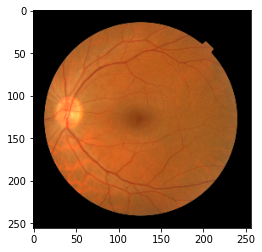

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


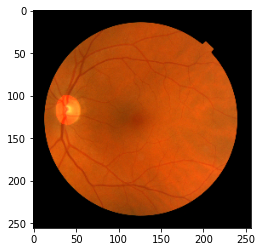

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


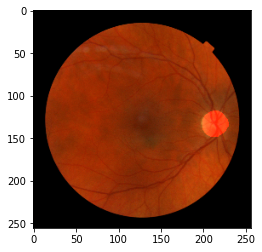

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


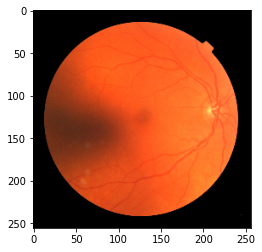

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


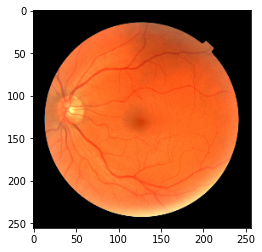

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


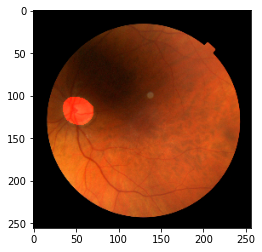

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


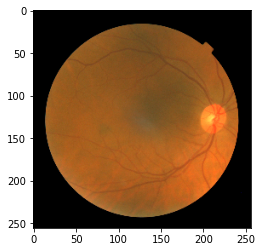

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


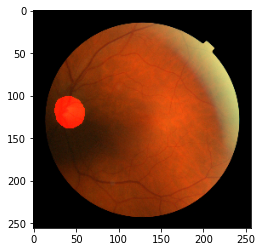

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


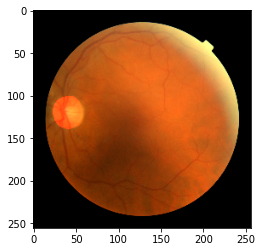

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


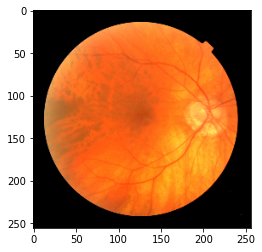

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


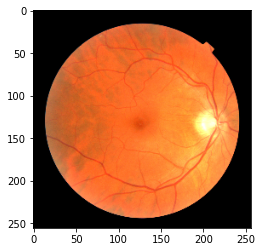

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


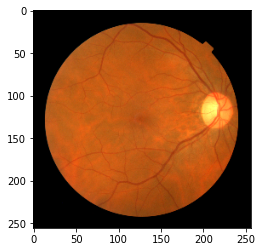

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


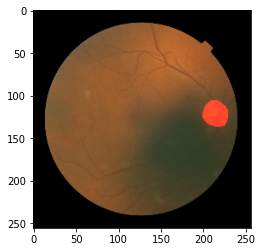

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


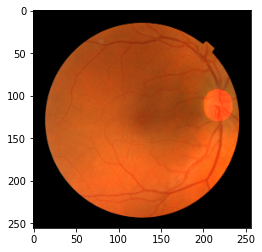

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


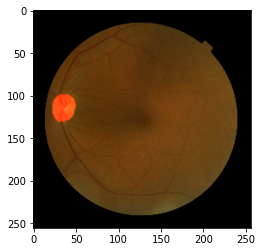

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


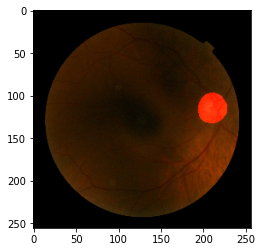

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


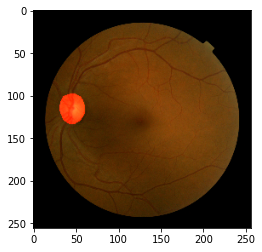

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


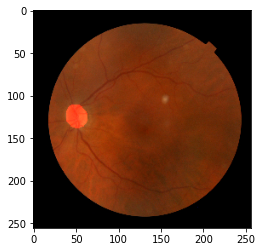

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


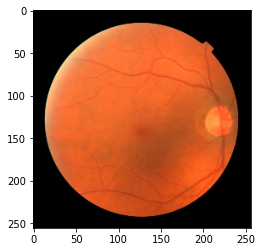

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


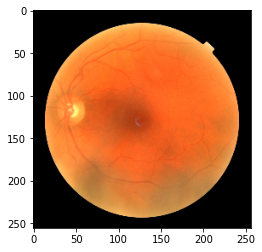

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


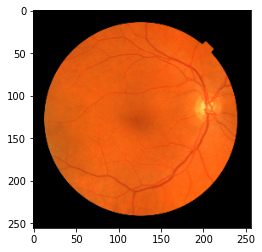

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


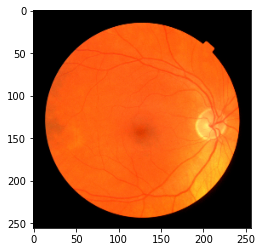

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


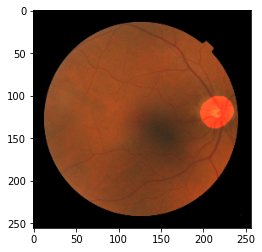

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


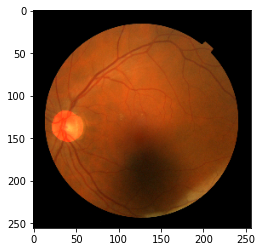

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


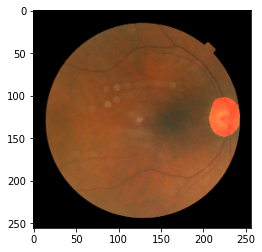

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


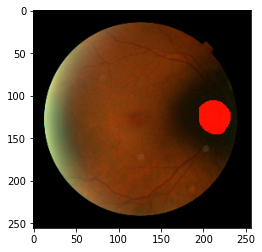

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


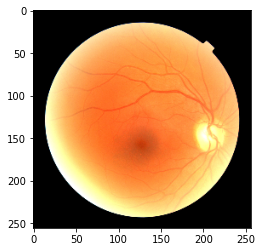

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


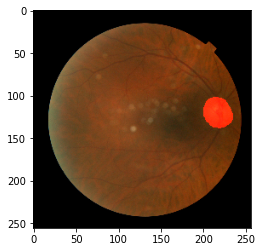

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


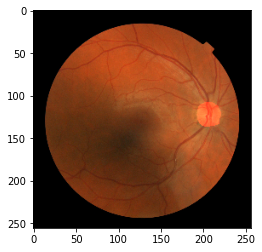

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


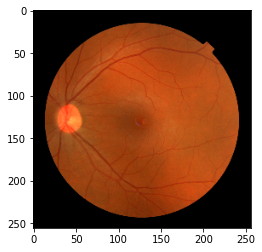

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


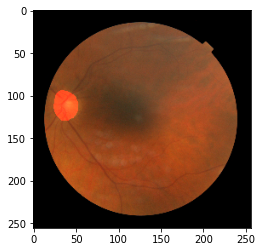

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


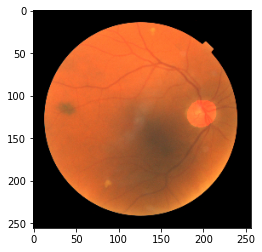

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


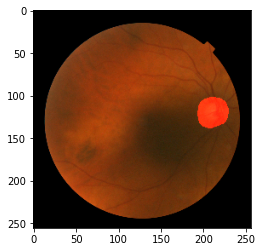

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


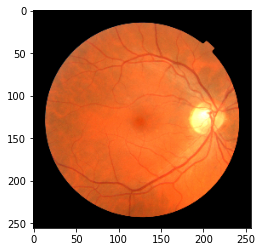

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


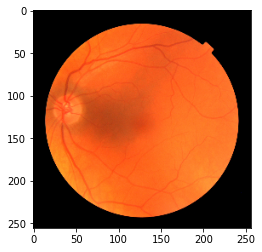

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


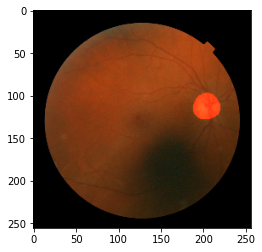

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


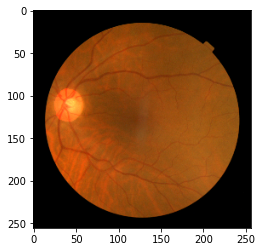

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


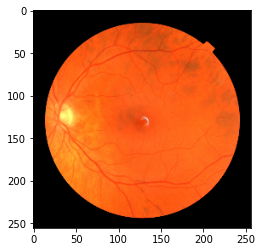

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


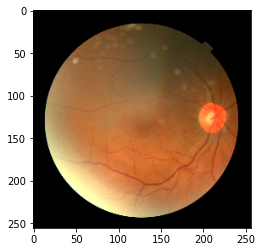

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


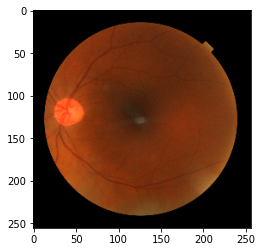

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


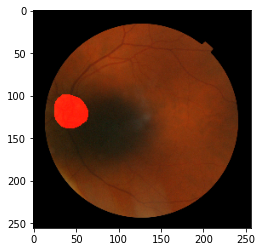

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


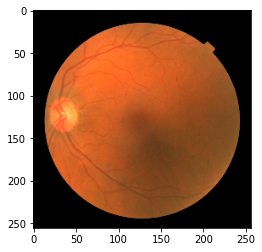

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


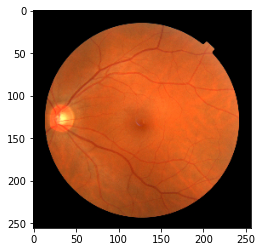

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


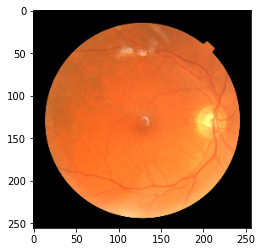

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


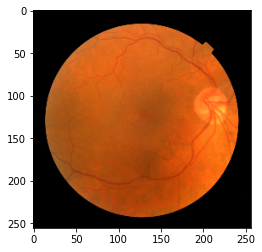

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


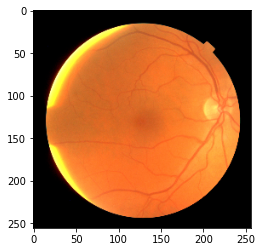

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


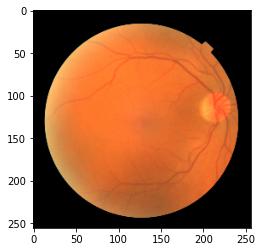

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


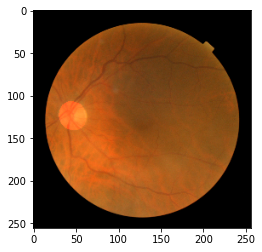

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


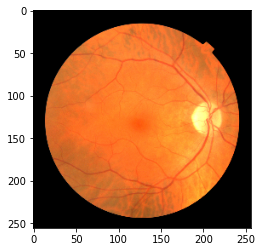

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


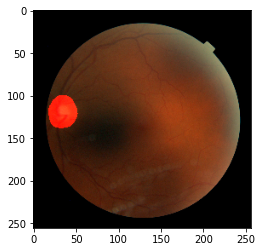

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


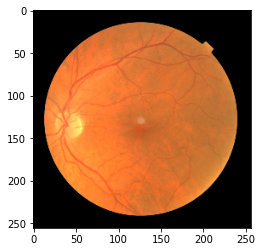

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


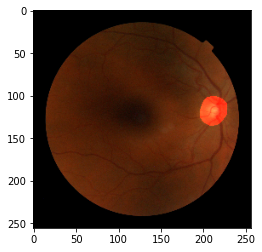

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


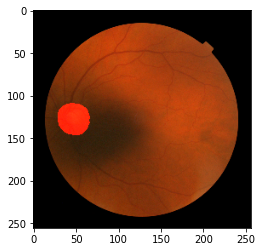

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


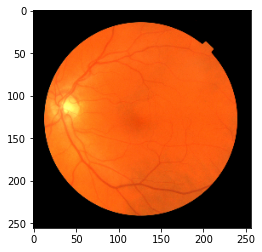

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


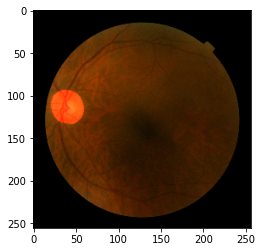

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


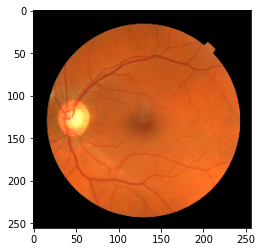

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


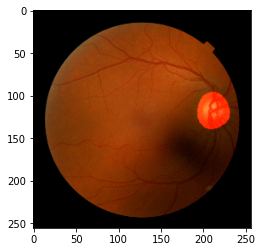

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


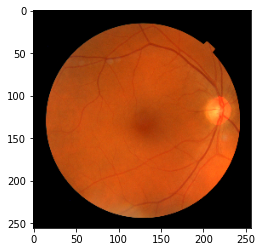

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


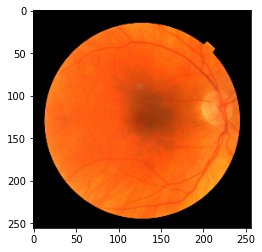

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


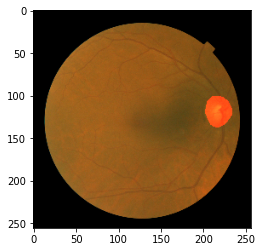

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


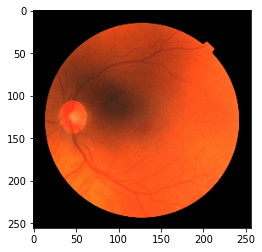

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


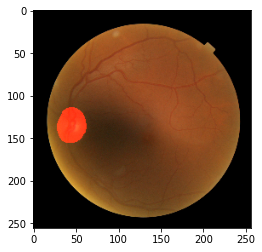

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


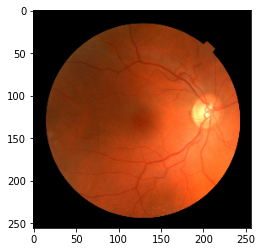

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


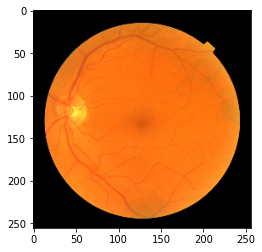

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


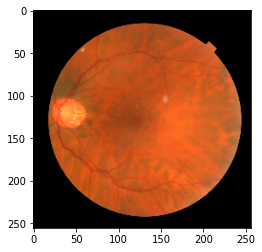

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


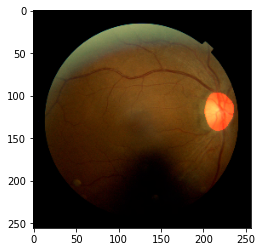

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


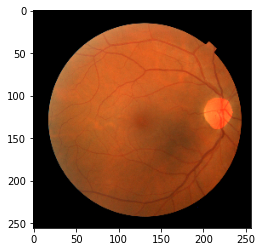

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


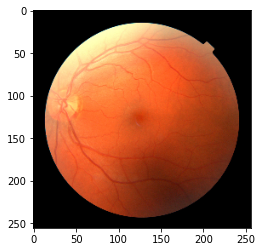

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


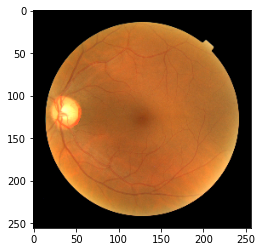

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


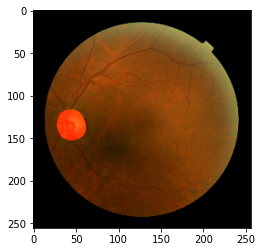

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


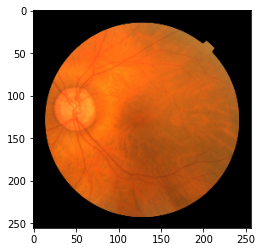

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


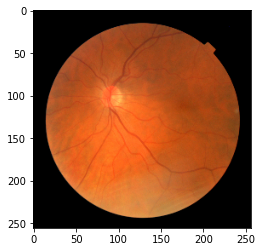

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


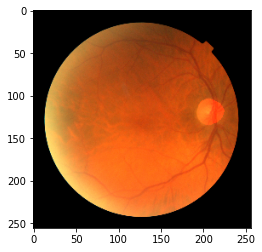

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


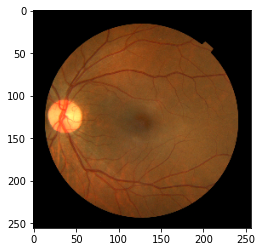

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


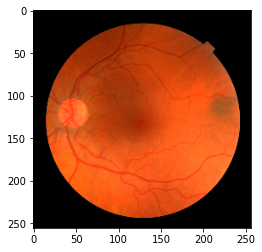

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


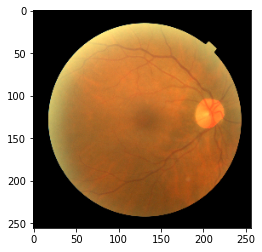

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


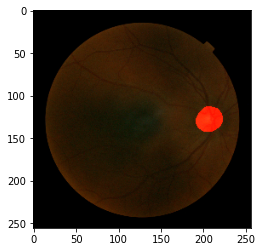

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


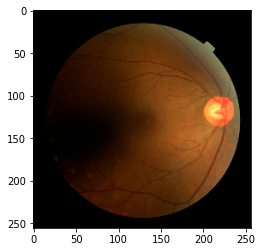

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


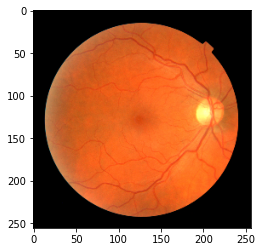

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


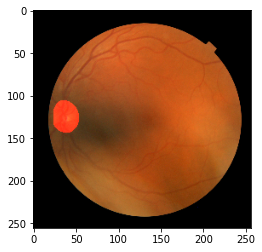

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


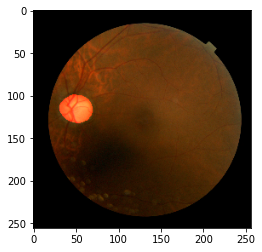

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


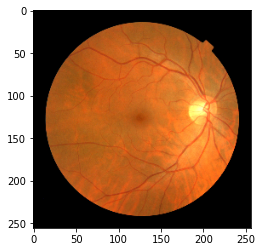

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


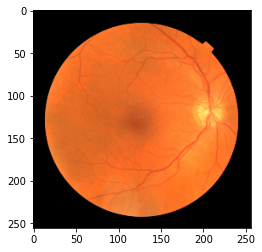

In [10]:
from matplotlib import pyplot as plt
for i in range(0,100):
    X = h5f['orig'][i]
    Y = h5f['masks'][i]

    cur = X.copy()
    cur[np.where(Y)] = 1000
    # plt.hist(Y.flatten(), 256)
    # plt.show()
    # plt.imshow(X)
    # plt.show()
    plt.imshow(cur)
    plt.show()

In [82]:
unique, counts = np.unique(h5f['images'][0], return_counts=True)
unique,counts

(array([  0,  64, 128, 191, 255]),
 array([194052,     18,     21,     12,   2505]))

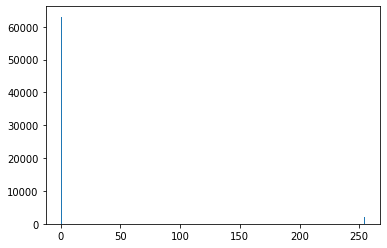

In [42]:
plt.hist(h5f['RIM-ONE v3']['256 px']['disc'][0].flatten(), 200);

In [4]:
h5f = h5py.File(os.path.join(os.path.dirname(os.getcwd()), 'data', 'hdf5_datasets', 'all_data.hdf5'), 'r+')

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '/SSD/home/michael/brynhild/software/optic-nerve-cnn/data/hdf5_datasets/all_data.hdf5', errno = 2, error message = 'No such file or directory', flags = 1, o_flags = 2)

### Exploring data

In [5]:
X, Y, filenames = extract_DRIONS_DB(os.path.join(os.path.dirname(os.getcwd()), 'data', 'DRIONS-DB'), expert=1)
len(X), X[0].shape, len(Y), Y[0].shape, len(filenames)

error: OpenCV(4.5.4) :-1: error: (-5:Bad argument) in function 'fillPoly'
> Overload resolution failed:
>  - Can't parse 'pts'. Sequence item with index 0 has a wrong type
>  - Can't parse 'pts'. Sequence item with index 0 has a wrong type


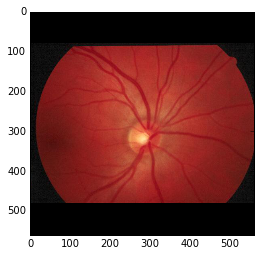

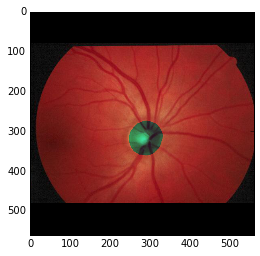

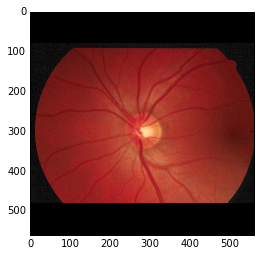

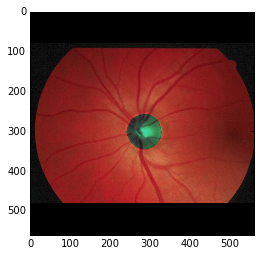

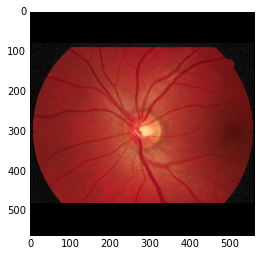

...

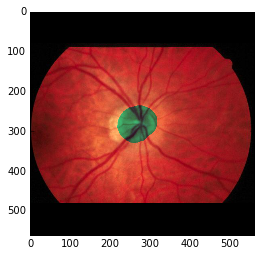

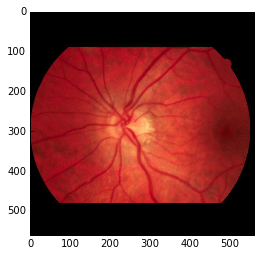

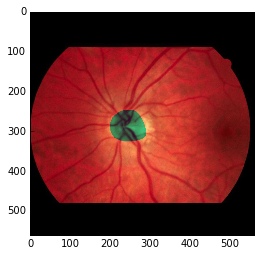

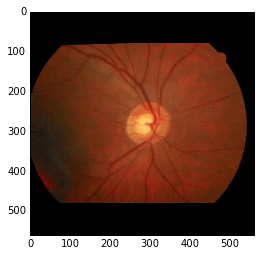

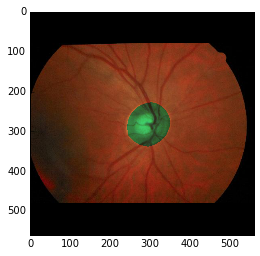

In [41]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(Y[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [10]:
X, Y, filenames, is_ill = extract_RIM_ONE_v2(os.path.join(os.path.dirname(os.getcwd()), 'data', 'RIM-ONE v2'))
len(X), X[0].shape, len(Y), Y[0].shape, len(filenames), len(is_ill)

(455, (394, 394, 3), 455, (394, 394, 1), 455, 455)

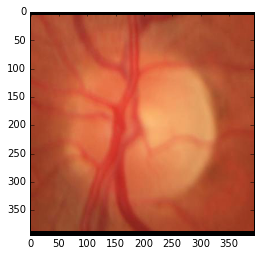

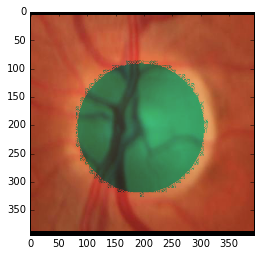

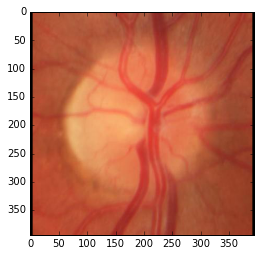

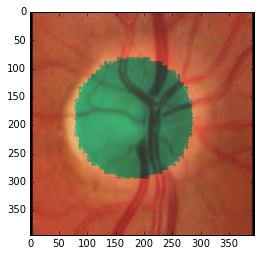

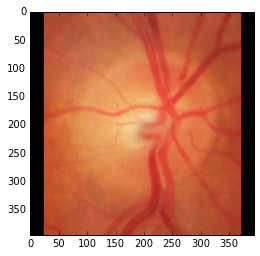

...

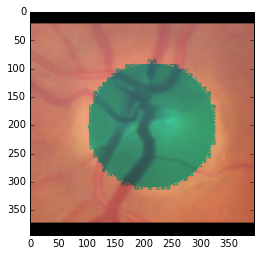

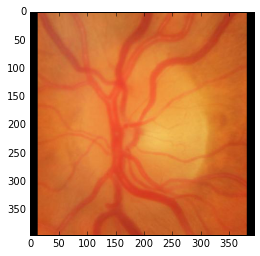

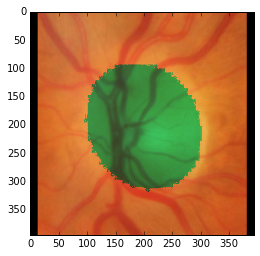

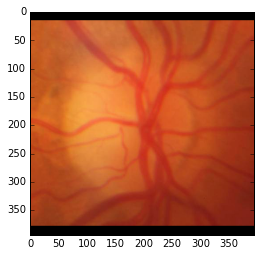

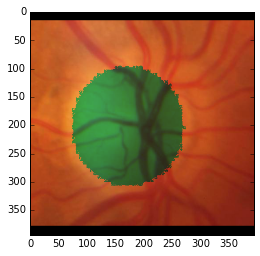

In [12]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(Y[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [7]:
X, disc, cup, filenames, is_ill = extract_RIM_ONE_v3(os.path.join(os.path.dirname(os.getcwd()), 'data', 'RIM-ONE v3'))
len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, \
    len(filenames), len(is_ill)

(159, (1424, 1424, 3), 159, (1424, 1424, 1), 159, (1424, 1424, 1), 159, 159)

N-1-L


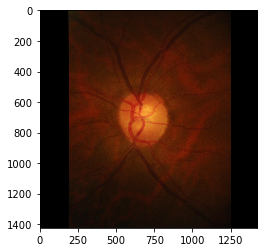

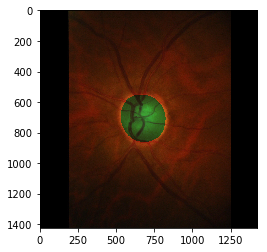

N-10-R


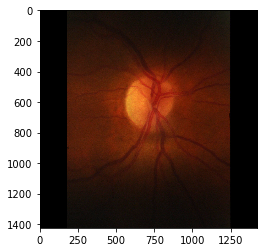

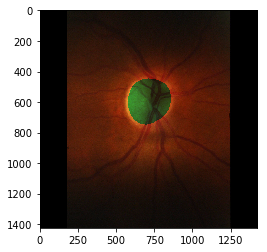

N-11-L


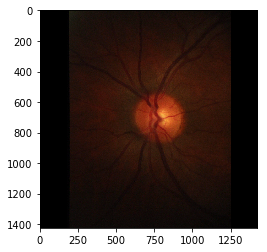

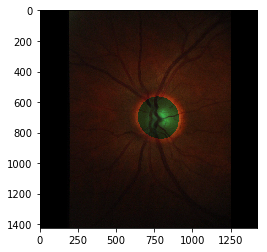

N-12-R


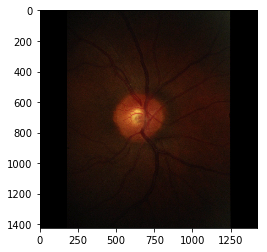

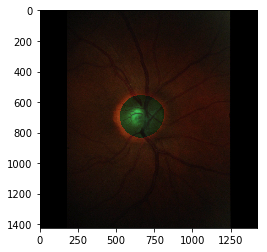

N-13-L


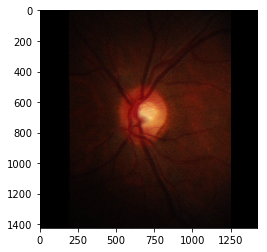

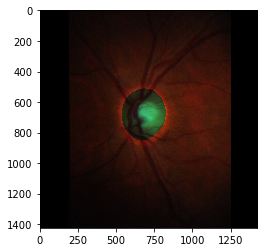

N-14-R


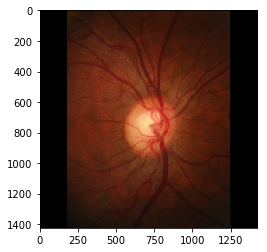

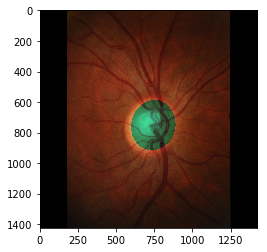

N-16-R


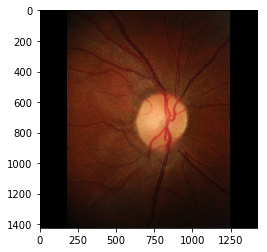

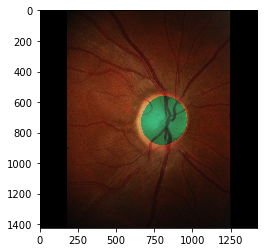

N-17-L


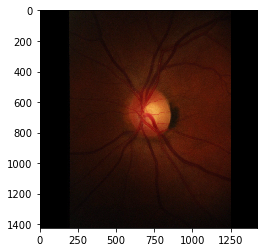

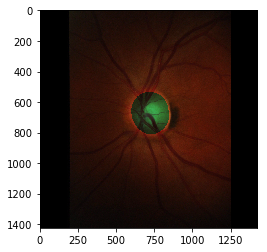

N-18-R


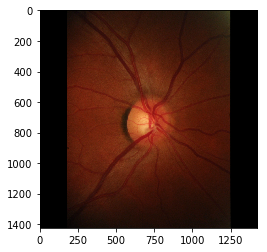

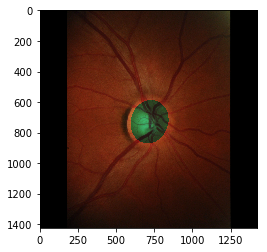

N-2-R


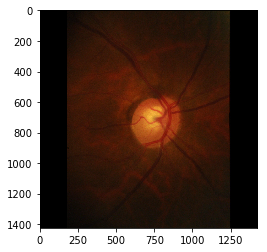

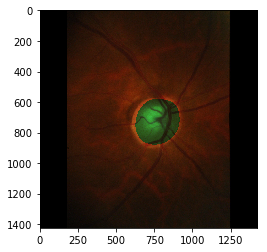

In [8]:
for i in xrange(10):
    print(filenames[i])
    cur = X[i].copy()
    cur[np.where(disc[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [18]:
X, Y, filenames, is_ill = extract_HRF(os.path.join(os.path.dirname(os.getcwd()), 'data', 'HRF'))
len(X), X[0].shape, len(Y), Y[0].shape, len(filenames), len(is_ill)

(30, (3504, 3504, 3), 30, (3504, 3504), 30, 30)

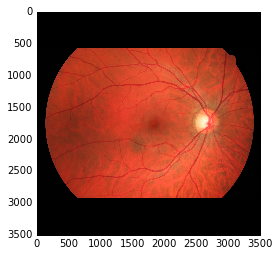

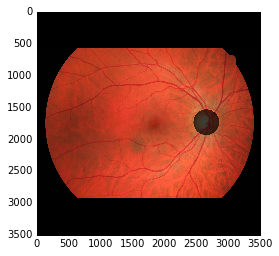

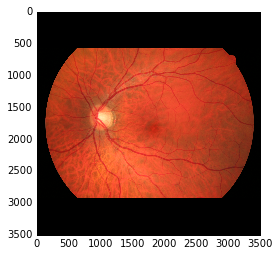

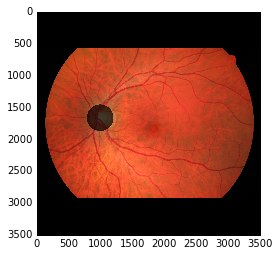

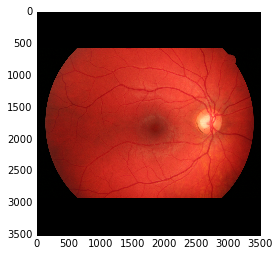

...

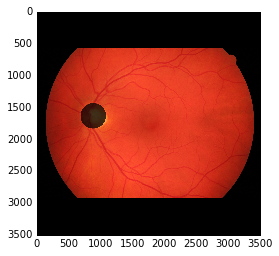

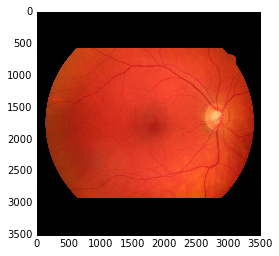

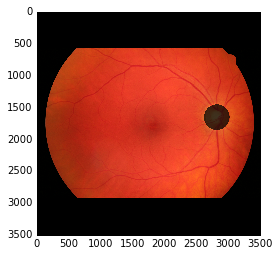

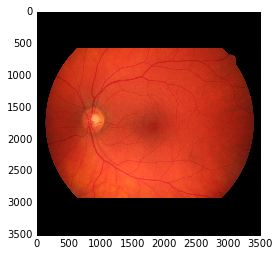

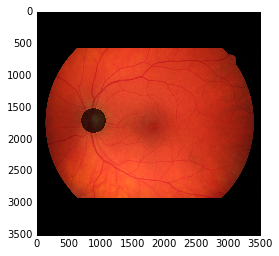

In [7]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(Y[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [23]:
X, disc, cup, file_codes = extract_DRISHTI_GS_train(os.path.join(os.path.dirname(os.getcwd()), 'data', 'DRISHTI-GS'))
print(len(X), len(disc), len(cup), len(file_codes))
print(len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, len(file_codes))

50 50 50 50
50 (2040, 2040, 3) 50 (2040, 2040, 1) 50 (2040, 2040, 1) 50


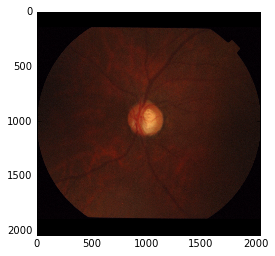

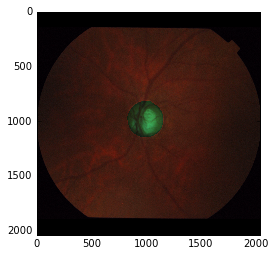

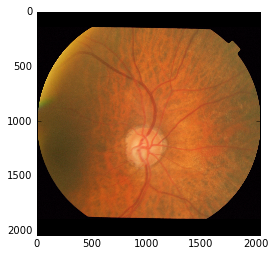

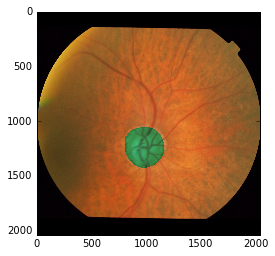

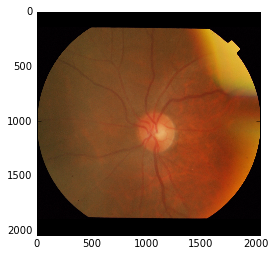

...

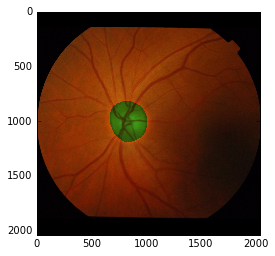

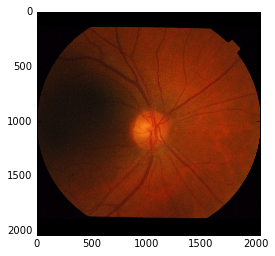

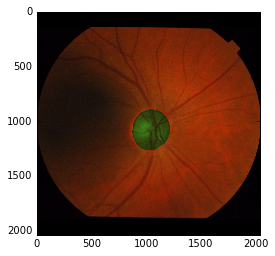

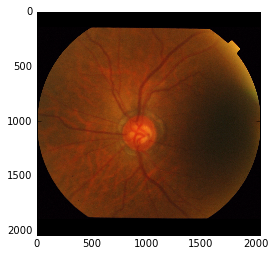

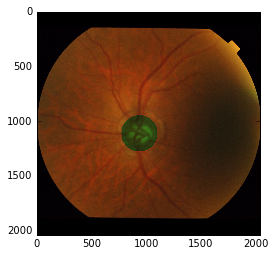

In [15]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(disc[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

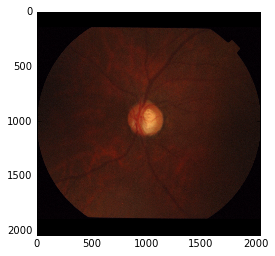

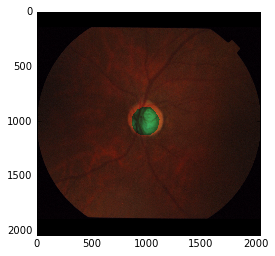

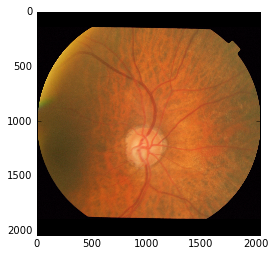

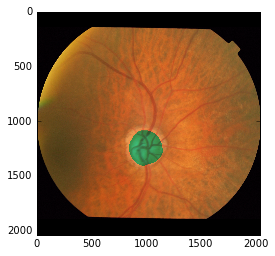

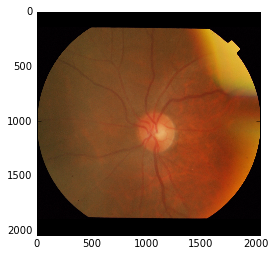

...

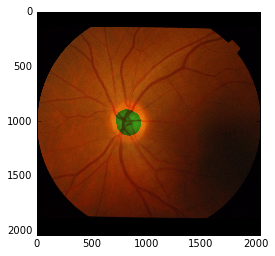

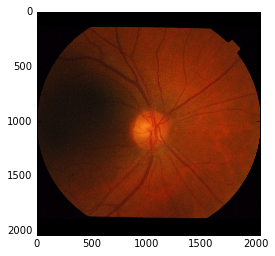

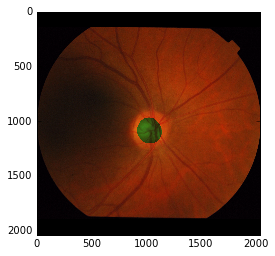

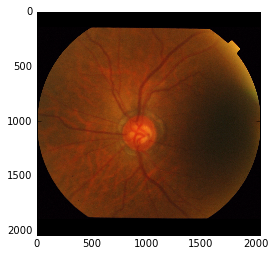

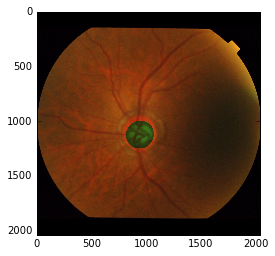

In [16]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(cup[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [28]:
X, file_codes = extract_DRISHTI_GS_test(os.path.join(os.path.dirname(os.getcwd()), 'data', 'DRISHTI-GS'))
print(len(X), len(file_codes))
print(len(X), X[0].shape, len(file_codes))

51 51
51 (2040, 2040, 3) 51


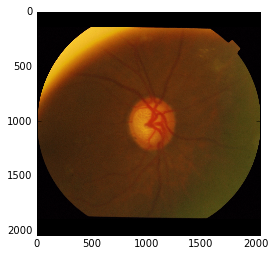

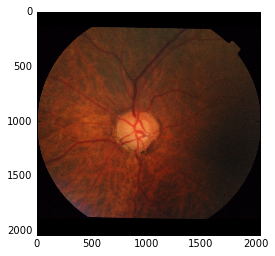

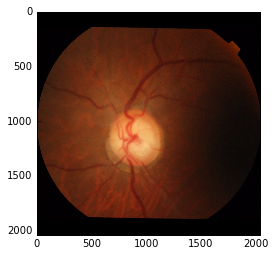

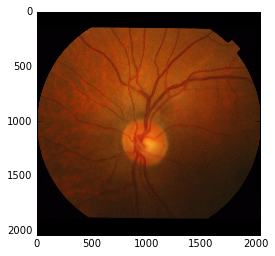

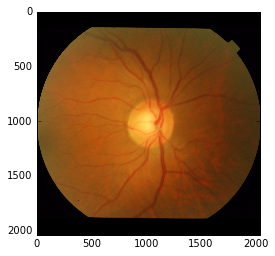

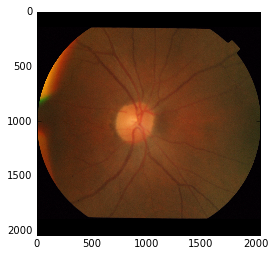

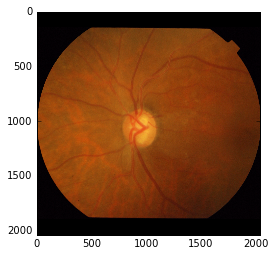

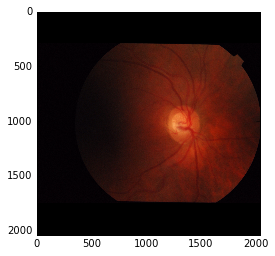

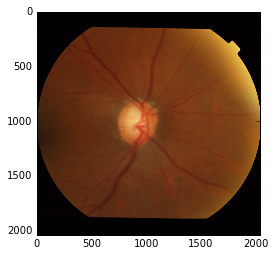

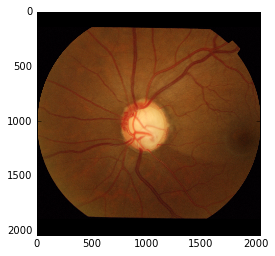

In [27]:
for i in xrange(10):
    plt.imshow(X[i])
    plt.show()

### Saving original data

In [ ]:
h5f.create_group("DRIONS-DB/orig")
h5f.create_group("RIM-ONE v2/orig")
h5f.create_group("RIM-ONE v3/orig")
h5f.create_group("HRF/orig")

#### DRIONS-DB

In [5]:
X, Y, file_codes = extract_DRIONS_DB(os.path.join(os.path.dirname(os.getcwd()), 'data', 'DRIONS-DB'), expert=1)
len(X), X[0].shape, len(Y), Y[0].shape, len(file_codes)

(110, (560, 560, 3), 110, (560, 560, 1), 110)

In [6]:
resolution = get_resolution_DRIONS_DB()
X_ds = h5f.create_dataset("DRIONS-DB/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("DRIONS-DB/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("DRIONS-DB/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype='S3', compression="gzip")

In [7]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(Y)
file_codes_ds[:] = np.array(file_codes)

In [6]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

[ 74  87  58  52  53  26  25  56  98   5  12   2 105  90  54  94  68  73
  47   3  88  78  89  75  40  11  41  19  67  37  18  86  71  91  50 108
 103  39  20  57  31  66   4  48  27  33  44  81  49  24  85  38 107  92
  10  72  61  15 109  59 104  42  65  22  46 101  79  21  97  23   9  60
  93  70  29   7  62] [  0   1   6   8  13  14  16  17  28  30  32  34  35  36  43  45  51  55
  63  64  69  76  77  80  82  83  84  95  96  99 100 102 106]


In [7]:
train_idx_ds = h5f.create_dataset("DRIONS-DB/train_idx", data=train_idx)
test_id_ds = h5f.create_dataset("DRIONS-DB/test_idx", data=test_idx)

In [56]:
#del h5f["DRIONS-DB/orig/images"]
#del h5f["DRIONS-DB/orig/disc"]
#del h5f["DRIONS-DB/orig/file_codes"]

#### RIM-ONE v2

In [18]:
X, Y, file_codes, is_ill = extract_RIM_ONE_v2(os.path.join(os.path.dirname(os.getcwd()), 'data', 'RIM-ONE v2'))
len(X), X[0].shape, len(Y), Y[0].shape, len(file_codes), len(is_ill)

(455, (394, 394, 3), 455, (394, 394, 1), 455, 455)

In [12]:
resolution = get_resolution_RIM_ONE_v2()
str_dt = h5py.special_dtype(vlen=unicode)

X_ds = h5f.create_dataset("RIM-ONE v2/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("RIM-ONE v2/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("RIM-ONE v2/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")
is_ill_ds = h5f.create_dataset("RIM-ONE v2/orig/is_ill", 
                               (len(X),),
                               chunks=True, 
                               dtype='u1', compression="gzip")

In [13]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(Y)
file_codes_ds[:] = np.array(file_codes)
is_ill_ds[:] = np.array(is_ill)

In [19]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

[158 338  23 335 157 325 226 216 122 224 315 451 392 350 100 141 396 280
  24 160 214 229 203 283  18 379 267 227 377 374 147 434 281 236  57 409
 218 183 339 143 217 156 197 255  58 366 104 423 134 410 386 435  31 108
   5 441 354 314 210   1 175 130 285 171 360  43 151  10 431 275 244  14
 167 219 163 305 288 372  56  79 107  26 329  60 447 448 368 378 240 172
 370 140 450 161 389 445 401 132 125 153 391 411 239 454 415  71  53 186
 320  37 427  50 387 142 190 230 213 194 333 121 406 128 299  51 443  20
  22 266 154 282 365 195 144  77 123 225 332 106  32 331 278  99 248 135
 205  21 231 312 421  61 196  52 395 222 279 429 166  65 101  93 307 444
  55 388 115 384  28 399 241 296 426 412 363 436  49 289 212  74 173 215
  96 262 136  87  11 110 373  88 418  94 131 111 390  70 223 102  97 246
 220 185 394 342 245 178 114 301 191 439 309  78 235 247 168 351  30 357
 400  98 419 276 323 326 182 202 187 211 127 198 380  38 319 237 318 159
 206 430 352 449  85 398 145 428 347  82 150 177 18

In [23]:
print(len(train_idx), len(test_idx), len(file_codes))
print(len(train_idx) + len(test_idx) == len(file_codes))

318 137 455
True


In [21]:
train_idx_ds = h5f.create_dataset("RIM-ONE v2/train_idx", data=train_idx)
test_id_ds = h5f.create_dataset("RIM-ONE v2/test_idx", data=test_idx)

#### RIM-ONE v3

In [8]:
X, disc, cup, file_codes, is_ill = extract_RIM_ONE_v3(os.path.join(os.path.dirname(os.getcwd()), 'data', 'RIM-ONE v3'))
len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, \
    len(file_codes), len(is_ill)

(159, (1424, 1424, 3), 159, (1424, 1424, 1), 159, (1424, 1424, 1), 159, 159)

In [9]:
resolution = get_resolution_RIM_ONE_v3()
str_dt = h5py.special_dtype(vlen=unicode)

In [10]:
X_ds = h5f.create_dataset("RIM-ONE v3/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("RIM-ONE v3/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("RIM-ONE v3/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")
is_ill_ds = h5f.create_dataset("RIM-ONE v3/orig/is_ill", 
                               (len(X),),
                               chunks=True, 
                               dtype='u1', compression="gzip")

In [11]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(disc)
file_codes_ds[:] = np.array(file_codes)
is_ill_ds[:] = np.array(is_ill)

In [12]:
cup_ds = h5f.create_dataset("RIM-ONE v3/orig/cup", 
                            (len(X),) + resolution + (1,),  
                            chunks=(2,) + resolution + (1,), 
                            dtype='u1', compression="gzip")

In [13]:
cup_ds[:] = np.array(cup)

In [14]:
driu_imgs, driu_filenames = imh.load_set(os.path.join(os.path.dirname(os.getcwd()), 'data', 'RIM-ONE v3', 'DRIU results', 'DRIU'))
driu_filecodes = map(lambda s: s[s.rfind('/') + 1:s.rfind('.')], driu_filenames)

In [15]:
test_idx = [file_codes.index(el) for el in driu_filecodes]
train_idx = list(set(range(len(file_codes))) - set(test_idx))
len(train_idx), len(test_idx), len(file_codes)

(99, 60, 159)

In [16]:
train_idx_ds = h5f.create_dataset("RIM-ONE v3/train_idx_driu", data=train_idx)
test_idx_ds = h5f.create_dataset("RIM-ONE v3/test_idx_driu", data=test_idx)

#### HRF

In [24]:
X, Y, file_codes, is_ill = extract_HRF(os.path.join(os.path.dirname(os.getcwd()), 'data', 'HRF'))
len(X), X[0].shape, len(Y), Y[0].shape, len(file_codes), len(is_ill)

(30, (3504, 3504, 3), 30, (3504, 3504, 1), 30, 30)

In [22]:
resolution = get_resolution_HRF()
str_dt = h5py.special_dtype(vlen=unicode)

X_ds = h5f.create_dataset("HRF/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("HRF/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("HRF/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")
is_ill_ds = h5f.create_dataset("HRF/orig/is_ill", 
                               (len(X),),
                               chunks=True, 
                               dtype='u1', compression="gzip")

In [23]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(Y)
file_codes_ds[:] = np.array(file_codes)
is_ill_ds[:] = np.array(is_ill)

In [25]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

[18 19 28  1 21  4  7 11 10  9  0  6 22 16 27 14  8 20 25  5 13] [ 2  3 12 15 17 23 24 26 29]


In [26]:
print(len(train_idx), len(test_idx), len(file_codes))
print(len(train_idx) + len(test_idx) == len(file_codes))

21 9 30
True


In [27]:
train_idx_ds = h5f.create_dataset("HRF/train_idx", data=train_idx)
test_idx_ds = h5f.create_dataset("HRF/test_idx", data=test_idx)

#### DRISHTI-GS (train)

In [29]:
X, disc, cup, file_codes = extract_DRISHTI_GS_train(os.path.join(os.path.dirname(os.getcwd()), 'data', 'DRISHTI_GS'))
len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, len(file_codes)

(50, (2040, 2040, 3), 50, (2040, 2040, 1), 50, (2040, 2040, 1), 50)

In [30]:
resolution = get_resolution_DRISHTI_GS()
str_dt = h5py.special_dtype(vlen=unicode)

In [13]:
X_ds = h5f.create_dataset("DRISHTI-GS/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("DRISHTI-GS/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
cup_ds = h5f.create_dataset("DRISHTI-GS/orig/cup", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("DRISHTI-GS/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")

In [14]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(disc)
cup_ds[:] = np.array(cup)
file_codes_ds[:] = np.array(file_codes)

In [31]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

[29 24 46 23 25 19  2 42 20 38 28  7 45  8 17 32 18  1 39  4 13 41 33 31 43
 22  3 36 48  0 12 30  5 16 10] [34 35 37  6 47 40  9 11 44 14 15 49 21 26 27]


In [32]:
print(len(train_idx), len(test_idx), len(file_codes))
print(len(train_idx) + len(test_idx) == len(file_codes))

35 15 50
True


In [33]:
train_idx_ds = h5f.create_dataset("DRISHTI-GS/train_idx", data=train_idx)
test_idx_ds = h5f.create_dataset("DRISHTI-GS/test_idx", data=test_idx)

#### DRISHTI-GS (test)

In [16]:
X, file_codes = extract_DRISHTI_GS_test(os.path.join(os.path.dirname(os.getcwd()), 'data', 'DRISHTI_GS'))
len(X), X[0].shape, len(file_codes)

(51, (2040, 2040, 3), 51)

In [17]:
resolution = get_resolution_DRISHTI_GS()
str_dt = h5py.special_dtype(vlen=unicode)

In [18]:
X_ds = h5f.create_dataset("DRISHTI-GS-test/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("DRISHTI-GS-test/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")

In [19]:
X_ds[:] = np.array(X)
file_codes_ds[:] = np.array(file_codes)

### Saving resized data

In [20]:
resolutions = (512, 256, 128)
#db_names = ('DRIONS-DB', 'RIM-ONE v2', 'RIM-ONE v3', 'HRF', 'DRISHTI-GS')
db_names = ('DRISHTI-GS',)

In [21]:
for res in resolutions:
    h5f.create_group("DRIONS-DB/{} px".format(res))
    h5f.create_group("RIM-ONE v2/{} px".format(res))
    h5f.create_group("RIM-ONE v3/{} px".format(res))
    h5f.create_group("HRF/{} px".format(res))
    h5f.create_group("DRISHTI-GS/{} px".format(res))

In [22]:
for db in db_names:
    X_ds = h5f['{}/orig/images'.format(db)]
    disc_ds = h5f['{}/orig/disc'.format(db)]
    file_codes_ds = h5f['{}/orig/file_codes'.format(db)]
    if db != 'DRIONS-DB' and db != 'DRISHTI-GS':
        is_ill_ds = h5f['{}/orig/is_ill'.format(db)]
    
    for res in resolutions:
        print('Copying data for {}, resolution {}'.format(db, res))
        X_small_ds = h5f.create_dataset("{}/{} px/images".format(db, res), 
                                        (X_ds.shape[0], res, res, 3,), 
                                        chunks=(2, res, res, 3,), 
                                        dtype='u1', compression="gzip")
        disc_small_ds = h5f.create_dataset("{}/{} px/disc".format(db, res), 
                                           (X_ds.shape[0], res, res, 1,),  
                                           chunks=(2, res, res, 1,), 
                                           dtype='u1', compression="gzip")
        str_dt = h5py.special_dtype(vlen=unicode)
        file_codes_small_ds = h5f.create_dataset("{}/{} px/file_codes".format(db, res), 
                                                 (X_ds.shape[0],),  
                                                 chunks=True, 
                                                 dtype=str_dt, compression="gzip")
        
        for i in tqdm_notebook(xrange(X_ds.shape[0]), leave=True):
            X_small_ds[i] = sp.misc.imresize(X_ds[i], size=(res, res))
            cur_disc_small = sp.misc.imresize(disc_ds[i][..., 0], size=(res, res))
            disc_small_ds[i] = cur_disc_small[..., np.newaxis]
        file_codes_small_ds[:] = file_codes_ds[:]
        
        if db != 'DRIONS-DB' and db != 'DRISHTI-GS':
            is_ill_small_ds = h5f.create_dataset("{}/{} px/is_ill".format(db, res), 
                                                 (X_ds.shape[0],),
                                                 chunks=True, 
                                                 dtype='u1', compression="gzip")
            is_ill_small_ds[:] = is_ill_ds

Copying data for DRISHTI-GS, resolution 512

Copying data for DRISHTI-GS, resolution 256

Copying data for DRISHTI-GS, resolution 128



In [23]:
# Copying cup for RIM-ONE v3 and DRISHTI-GS

for db in ('RIM-ONE v3', 'DRISHTI-GS'):
    X_ds = h5f['{}/orig/images'.format(db)]
    cup_ds = h5f['{}/orig/cup'.format(db)]

    for res in resolutions:
        print('Copying cup for {}, resolution {}'.format(db, res))
        cup_small_ds = h5f.create_dataset("{}/{} px/cup".format(db, res), 
                                          (X_ds.shape[0], res, res, 1,),  
                                          chunks=(2, res, res, 1,), 
                                          dtype='u1', compression="gzip")
        for i in tqdm_notebook(xrange(X_ds.shape[0]), leave=True):
            cur_cup_small = sp.misc.imresize(cup_ds[i][..., 0], size=(res, res))
            cup_small_ds[i] = cur_cup_small[..., np.newaxis]

Copying cup for DRISHTI-GS, resolution 512

Copying cup for DRISHTI-GS, resolution 256

Copying cup for DRISHTI-GS, resolution 128



In [20]:
# Finding disc bounding box on RIM-ONE v3 512px, saving its coordinates,
# and saving bounding box resized to standard resolution

gap = 20
standard_res = (256, 256)

print('Saving disc bbox coordinates for RIM-ONE v3')
X_ds = h5f['RIM-ONE v3/512 px/images']
disc_ds = h5f['RIM-ONE v3/512 px/disc']
cup_ds = h5f['RIM-ONE v3/512 px/cup']
disc_locations = np.empty((X_ds.shape[0], 4), dtype=np.int64)
# disc_locations[i] stores (min_i, min_j, max_i, max_j)
cup_cropped = np.empty((X_ds.shape[0],) + standard_res + (1,), dtype=np.uint8)
img_cropped = np.empty((X_ds.shape[0],) + standard_res + (3,), dtype=np.uint8)

for i in tqdm_notebook(xrange(X_ds.shape[0]), leave=True):
    img = X_ds[i]
    disc = disc_ds[i, ..., 0]
    cup = cup_ds[i, ..., 0]

    labeled = skimage.measure.label(disc)
    region_props = skimage.measure.regionprops(labeled)
    component = max(region_props, key=attrgetter('area'))    # there should be only 1 component, 
                                                             # so this is a safety measure
    disc_locations[i][0] = max(component.bbox[0] - gap, 0)
    disc_locations[i][1] = max(component.bbox[1] - gap, 0)
    disc_locations[i][2] = min(component.bbox[2] + gap, img.shape[0] - 1)
    disc_locations[i][3] = min(component.bbox[3] + gap, img.shape[1] - 1)
    
    cup_cur_cropped = cup[disc_locations[i][0]:disc_locations[i][2],
                           disc_locations[i][1]:disc_locations[i][3]]
    cup_cur_cropped = sp.misc.imresize(cup_cur_cropped, standard_res)
    cup_cropped[i, ..., 0] = cup_cur_cropped
    img_cur_cropped = img[disc_locations[i][0]:disc_locations[i][2],
                           disc_locations[i][1]:disc_locations[i][3]]
    img_cur_cropped = sp.misc.imresize(img_cur_cropped, standard_res)
    img_cropped[i] = img_cur_cropped
    

h5f['RIM-ONE v3/512 px/disc_locations'] = disc_locations
#h5f['RIM-ONE v3/512 px/cup_cropped'] = cup_cropped
#h5f['RIM-ONE v3/512 px/img_cropped'] = img_cropped

Saving disc bbox coordinates for RIM-ONE v3



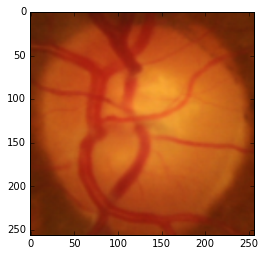

In [36]:
plt.imshow(img_cropped[0])

In [34]:
h5f.close()